In [ ]:
# Desafio (RE)START DATA SCIENCE | 30/11 a 04/12/21 
# Organizado por Data Girls Neuron

# Nome: Nathália Santiago | Dezembro/2021

In [ ]:
# The Data: The National Agency of Petroleum, Natural Gas and Bio fuels (ANP in Portuguese) releases weekly reports of gas, diesel and other fuels prices used in transportation across the country.
# These datasets bring the mean value per liter, number of gas stations analyzed and other information grouped by regions and states across the country.

# Source: National Agency of Petroleum, Natural Gas and Bio fuels (ANP-Brazil)

# LINK: https://www.kaggle.com/matheusfreitag/gas-prices-in-brazil

In [ ]:
## GOSTARIA MUITO DE FEEDBACK SOBRE ESTE EXERCÍCIO. ##

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importando bibliotecas
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn # modelos
import plotly.graph_objs as go
from plotly.subplots import make_subplots

In [ ]:
# Importando o dataset
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/2004-2019.tsv', delimiter = '\t')

In [ ]:
# Quantidade de linhas x colunas do dataset
df.shape

(106823, 21)

In [ ]:
# Nomes das colunas
df.columns

Index(['Unnamed: 0', 'DATA INICIAL', 'DATA FINAL', 'REGIÃO', 'ESTADO',
       'PRODUTO', 'NÚMERO DE POSTOS PESQUISADOS', 'UNIDADE DE MEDIDA',
       'PREÇO MÉDIO REVENDA', 'DESVIO PADRÃO REVENDA', 'PREÇO MÍNIMO REVENDA',
       'PREÇO MÁXIMO REVENDA', 'MARGEM MÉDIA REVENDA',
       'COEF DE VARIAÇÃO REVENDA', 'PREÇO MÉDIO DISTRIBUIÇÃO',
       'DESVIO PADRÃO DISTRIBUIÇÃO', 'PREÇO MÍNIMO DISTRIBUIÇÃO',
       'PREÇO MÁXIMO DISTRIBUIÇÃO', 'COEF DE VARIAÇÃO DISTRIBUIÇÃO', 'MÊS',
       'ANO'],
      dtype='object')

In [ ]:
# Informações sobre cada coluna
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106823 entries, 0 to 106822
Data columns (total 21 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   Unnamed: 0                     106823 non-null  int64  
 1   DATA INICIAL                   106823 non-null  object 
 2   DATA FINAL                     106823 non-null  object 
 3   REGIÃO                         106823 non-null  object 
 4   ESTADO                         106823 non-null  object 
 5   PRODUTO                        106823 non-null  object 
 6   NÚMERO DE POSTOS PESQUISADOS   106823 non-null  int64  
 7   UNIDADE DE MEDIDA              106823 non-null  object 
 8   PREÇO MÉDIO REVENDA            106823 non-null  float64
 9   DESVIO PADRÃO REVENDA          106823 non-null  float64
 10  PREÇO MÍNIMO REVENDA           106823 non-null  float64
 11  PREÇO MÁXIMO REVENDA           106823 non-null  float64
 12  MARGEM MÉDIA REVENDA          

In [ ]:
# Descrição geral da tabela
df.describe()

,Unnamed: 0,NÚMERO DE POSTOS PESQUISADOS,PREÇO MÉDIO REVENDA,DESVIO PADRÃO REVENDA,PREÇO MÍNIMO REVENDA,PREÇO MÁXIMO REVENDA,COEF DE VARIAÇÃO REVENDA,MÊS,ANO
count,106823.00000,106823.000000,106823.000000,106823.000000,106823.000000,106823.000000,106823.000000,106823.000000,106823.000000
mean,53411.00000,233.770976,10.870780,0.657227,9.416038,12.537731,0.045418,6.484006,2011.802271
std,30837.28824,403.282519,17.752533,1.349169,15.092193,20.841497,0.025066,3.443391,4.391530
min,0.00000,1.000000,0.766000,0.000000,0.590000,0.999000,0.000000,1.000000,2004.000000
25%,26705.50000,42.000000,2.072000,0.072000,1.900000,2.310000,0.029000,4.000000,2008.000000
50%,53411.00000,104.000000,2.718000,0.114000,2.510000,2.999000,0.041000,6.000000,2012.000000
75%,80116.50000,243.000000,3.752000,0.191000,3.499000,4.150000,0.058000,9.000000,2016.000000
max,106822.00000,4167.000000,99.357000,10.748000,90.000000,120.000000,0.395000,12.000000,2019.000000


In [ ]:
# Visualização do cabeçalho e primeiras linhas do dataset
df.head()

,Unnamed: 0,DATA INICIAL,DATA FINAL,REGIÃO,ESTADO,PRODUTO,NÚMERO DE POSTOS PESQUISADOS,UNIDADE DE MEDIDA,PREÇO MÉDIO REVENDA,DESVIO PADRÃO REVENDA,PREÇO MÍNIMO REVENDA,PREÇO MÁXIMO REVENDA,MARGEM MÉDIA REVENDA,COEF DE VARIAÇÃO REVENDA,PREÇO MÉDIO DISTRIBUIÇÃO,DESVIO PADRÃO DISTRIBUIÇÃO,PREÇO MÍNIMO DISTRIBUIÇÃO,PREÇO MÁXIMO DISTRIBUIÇÃO,COEF DE VARIAÇÃO DISTRIBUIÇÃO,MÊS,ANO
0,0,2004-05-09,2004-05-15,CENTRO OESTE,DISTRITO FEDERAL,ETANOL HIDRATADO,127,R$/l,1.288,0.016,1.19,1.350,0.463,0.012,0.825,0.11,0.4201,0.9666,0.133,5,2004
1,1,2004-05-09,2004-05-15,CENTRO OESTE,GOIAS,ETANOL HIDRATADO,387,R$/l,1.162,0.114,0.89,1.449,0.399,0.098,0.763,0.088,0.5013,1.05,0.115,5,2004
2,2,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO,ETANOL HIDRATADO,192,R$/l,1.389,0.097,1.18,1.760,0.419,0.070,0.97,0.095,0.5614,1.161,0.098,5,2004
3,3,2004-05-09,2004-05-15,CENTRO OESTE,MATO GROSSO DO SUL,ETANOL HIDRATADO,162,R$/l,1.262,0.070,1.09,1.509,0.432,0.055,0.83,0.119,0.5991,1.22242,0.143,5,2004
4,4,2004-05-09,2004-05-15,NORDESTE,ALAGOAS,ETANOL HIDRATADO,103,R$/l,1.181,0.078,1.05,1.400,0.24,0.066,0.941,0.077,0.7441,1.0317,0.082,5,2004


In [ ]:
#A primeira coluna 'unnamed' atua como index, porém o código numera as linhas da tabela, exercenco a mesma função, vou eliminar esta coluna
df = df.drop("Unnamed: 0", axis=1)

In [ ]:
# Renomear colunas para nomes sem espaço ou acento para facilitar a chamada nas próximas células - a referência de exercício traduziu para INGLÊS, vou seguir esse padrão.
df.rename(
    columns={
        "DATA INICIAL": "start_date",
        "DATA FINAL": "end_date",
        "REGIÃO": "region",
        "ESTADO": "state",
        "PRODUTO": "fuel",
        "NÚMERO DE POSTOS PESQUISADOS": "n_gas_stations",
        "UNIDADE DE MEDIDA": "unit",
        "PREÇO MÉDIO REVENDA": "avg_price",
        "DESVIO PADRÃO REVENDA": "sd_price",
        "PREÇO MÍNIMO REVENDA": "min_price",
        "PREÇO MÁXIMO REVENDA": "max_price",
        "MARGEM MÉDIA REVENDA": "avg_price_margin",
        "ANO": "year",
        "MÊS": "month",
        "COEF DE VARIAÇÃO DISTRIBUIÇÃO": "coef_dist",
        "PREÇO MÁXIMO DISTRIBUIÇÃO": "dist_max_price",
        "PREÇO MÍNIMO DISTRIBUIÇÃO": "dist_min_price",
        "DESVIO PADRÃO DISTRIBUIÇÃO": "dist_sd_price",
        "PREÇO MÉDIO DISTRIBUIÇÃO": "dist_avg_price",
        "COEF DE VARIAÇÃO REVENDA": "coef_price"
    },
    inplace=True
)

In [ ]:
# Verificando se os nomes das colunas foram atualizados
df.columns

Index(['start_date', 'end_date', 'region', 'state', 'fuel', 'n_gas_stations',
       'unit', 'avg_price', 'sd_price', 'min_price', 'max_price',
       'avg_price_margin', 'coef_price', 'dist_avg_price', 'dist_sd_price',
       'dist_min_price', 'dist_max_price', 'coef_dist', 'month', 'year'],
      dtype='object')

In [ ]:
# Atualizando as categorias para INGLÊS: regiões (regions)
# A coluna estado(state) não necessita tradução

regions = {"SUL":"SOUTH", "SUDESTE":"SOUTHEAST", "CENTRO OESTE":"MIDWEST", 
            "NORTE":"NORTH", "NORDESTE":"NORTHEAST"}
df["region"] = df.region.map(regions)

In [ ]:
# Verificando a trasnformação
df.region.value_counts()

NORTHEAST    36869
NORTH        24702
SOUTHEAST    17047
MIDWEST      15429
SOUTH        12776
Name: region, dtype: int64

In [ ]:
# Atualizando as categorias para INGLÊS: combustíveis(fuels)
fuels = {"ÓLEO DIESEL":"DIESEL", "GASOLINA COMUM":"REGULAR GASOLINE", "GLP":"LPG", 
            "ETANOL HIDRATADO":"HYDROUS ETHANOL", "GNV":"NATURAL GAS", "ÓLEO DIESEL S10":"DIESEL S10"}
df["fuel"] = df.fuel.map(fuels)

In [ ]:
# Verificando a trasnformação
df.fuel.value_counts()

DIESEL              21194
REGULAR GASOLINE    21194
LPG                 21186
HYDROUS ETHANOL     21102
NATURAL GAS         13034
DIESEL S10           9113
Name: fuel, dtype: int64

In [ ]:
# As colunas região(regions), estado(state) e combustíveis(fuels) são categóricas. 
# Para facilitar o entendimento na comparação estatística e para visualização de dados, serão transformadas em numéricas, utilizando LabelEncoder: cria label numérico correspondente a cada categoria única encontrada na coluna.
## Aqui tive dúvidas entre usar o LabelEnconder e o Pandas.Factorize - utilizei o que o exemplo de referência já utilizava.##

from sklearn.preprocessing import LabelEncoder

labelencoder_region = LabelEncoder()
df['region_cd'] = labelencoder_region.fit_transform(df.region)

labelencoder_state = LabelEncoder()
df['state_cd'] = labelencoder_state.fit_transform(df.state)

labelencoder_fuel = LabelEncoder()
df['fuel_cd'] = labelencoder_fuel.fit_transform(df.fuel) 

In [ ]:
# Após codificar, verifico quais os códigos de cada um
df.groupby('region')['region_cd'].unique()

region
MIDWEST      [0]
NORTH        [1]
NORTHEAST    [2]
SOUTH        [3]
SOUTHEAST    [4]
Name: region_cd, dtype: object

In [ ]:
df.groupby('state')['state_cd'].unique()

state
ACRE                    [0]
ALAGOAS                 [1]
AMAPA                   [2]
AMAZONAS                [3]
BAHIA                   [4]
CEARA                   [5]
DISTRITO FEDERAL        [6]
ESPIRITO SANTO          [7]
GOIAS                   [8]
MARANHAO                [9]
MATO GROSSO            [10]
MATO GROSSO DO SUL     [11]
MINAS GERAIS           [12]
PARA                   [13]
PARAIBA                [14]
PARANA                 [15]
PERNAMBUCO             [16]
PIAUI                  [17]
RIO DE JANEIRO         [18]
RIO GRANDE DO NORTE    [19]
RIO GRANDE DO SUL      [20]
RONDONIA               [21]
RORAIMA                [22]
SANTA CATARINA         [23]
SAO PAULO              [24]
SERGIPE                [25]
TOCANTINS              [26]
Name: state_cd, dtype: object

In [ ]:
df.groupby('fuel')['fuel_cd'].unique()

fuel
DIESEL              [0]
DIESEL S10          [1]
HYDROUS ETHANOL     [2]
LPG                 [3]
NATURAL GAS         [4]
REGULAR GASOLINE    [5]
Name: fuel_cd, dtype: object

In [ ]:
# Quando pedimos para ver as primeiras linhas do dataset, observa-se que a coluna de unidades/units possuem tipos diferentes de unidades de referência.
# Será preciso converter para a mesma base.
df['unit'].unique()

array(['R$/l', 'R$/13Kg', 'R$/m3'], dtype=object)

In [ ]:
# Converter as unidades em base iguais para poder comparar mais a frente, criando a coluna 'CONVERSION'
event_dictionary_units ={'R$/l ' : 'R$/l', 'R$/13Kg' : 'R$/l', 'R$/m3' : 'R$/l'}
event_dictionary_conversion ={'R$/l' : 1 , 'R$/13Kg' : 0.00006153, 'R$/m3' : 0.001}

df['conversion'] = df['unit'].map(event_dictionary_conversion)
df['avg_price'] = df.avg_price*df.conversion
df['unit'] = df['unit'].map(event_dictionary_units)

df.tail()

,start_date,end_date,region,state,fuel,n_gas_stations,unit,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year,region_cd,state_cd,fuel_cd,conversion
106818,2019-06-23,2019-06-29,NORTHEAST,RIO GRANDE DO NORTE,NATURAL GAS,7,R$/l,0.003574,0.065,3.499,3.690,0.818,0.018,2.756,0,2.756,2.756,0,6,2019,2,19,4,0.001
106819,2019-06-23,2019-06-29,SOUTH,RIO GRANDE DO SUL,NATURAL GAS,23,R$/l,0.003401,0.129,3.230,3.789,0.95,0.038,2.451,0.402,1.9842,2.8661,0.164,6,2019,3,20,4,0.001
106820,2019-06-23,2019-06-29,SOUTH,SANTA CATARINA,NATURAL GAS,24,R$/l,0.002912,0.190,2.699,3.499,0.914,0.065,1.998,0,1.9981,1.9981,0,6,2019,3,23,4,0.001
106821,2019-06-23,2019-06-29,SOUTHEAST,SAO PAULO,NATURAL GAS,52,R$/l,0.003020,0.229,2.699,3.490,0.646,0.076,2.374,0.165,2.0179,2.5093,0.07,6,2019,4,24,4,0.001
106822,2019-06-23,2019-06-29,NORTHEAST,SERGIPE,NATURAL GAS,4,R$/l,0.003697,0.005,3.689,3.699,1.179,0.001,2.518,0,2.5175,2.5175,0,6,2019,2,25,4,0.001


In [ ]:
#  Verificação das colunas alteradas nas células acimas: categoricas agora são int.
#  OBS.: as colunas referentes a 'preço' não possuem o mesmo tipo de dados - float64; object, devendo também ser convertidas
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106823 entries, 0 to 106822
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   start_date        106823 non-null  object 
 1   end_date          106823 non-null  object 
 2   region            106823 non-null  object 
 3   state             106823 non-null  object 
 4   fuel              106823 non-null  object 
 5   n_gas_stations    106823 non-null  int64  
 6   unit              34220 non-null   object 
 7   avg_price         106823 non-null  float64
 8   sd_price          106823 non-null  float64
 9   min_price         106823 non-null  float64
 10  max_price         106823 non-null  float64
 11  avg_price_margin  106823 non-null  object 
 12  coef_price        106823 non-null  float64
 13  dist_avg_price    106823 non-null  object 
 14  dist_sd_price     106823 non-null  object 
 15  dist_min_price    106823 non-null  object 
 16  dist_max_price    10

In [ ]:
# Converter as colunas de preços para o mesmo tipo de dado
# to_numeric: transforma todas em int; error=coerce para ignorar possíveis nulos na conversão


for col in ['sd_price','min_price',
            'max_price','avg_price_margin','coef_price',
            'dist_avg_price', 'dist_sd_price', 'dist_min_price', 
            'dist_max_price', 'coef_dist']:
  
  df[col] = pd.to_numeric(df[col], errors='coerce')
    
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106823 entries, 0 to 106822
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   start_date        106823 non-null  object 
 1   end_date          106823 non-null  object 
 2   region            106823 non-null  object 
 3   state             106823 non-null  object 
 4   fuel              106823 non-null  object 
 5   n_gas_stations    106823 non-null  int64  
 6   unit              34220 non-null   object 
 7   avg_price         106823 non-null  float64
 8   sd_price          106823 non-null  float64
 9   min_price         106823 non-null  float64
 10  max_price         106823 non-null  float64
 11  avg_price_margin  103392 non-null  float64
 12  coef_price        106823 non-null  float64
 13  dist_avg_price    103423 non-null  float64
 14  dist_sd_price     103423 non-null  float64
 15  dist_min_price    103423 non-null  float64
 16  dist_max_price    10

In [ ]:
# Após as conversões de diversas colunas em tipos numéricos, é necessário verificar quais colunas possuem valores nulos.
df.isnull().sum()

start_date              0
end_date                0
region                  0
state                   0
fuel                    0
n_gas_stations          0
unit                72603
avg_price               0
sd_price                0
min_price               0
max_price               0
avg_price_margin     3431
coef_price              0
dist_avg_price       3400
dist_sd_price        3400
dist_min_price       3400
dist_max_price       3400
coef_dist            3400
month                   0
year                    0
region_cd               0
state_cd                0
fuel_cd                 0
conversion              0
dtype: int64

In [ ]:
# A coluna unidade(units) possui muitos valores nulos, porém a conversão das unidades já foi realizada na coluna 'conversion', por isso, ela será desconsiderada deste dataset.
df = df.drop("unit", axis = 1)

In [ ]:
# É possível observar que as colunas nulas são relacionadas ao preço, portanto, a decisão é de não eliminá-las agora, mas sim, preenchê-las com a média dos valores de suas respectivas colunas
df['avg_price_margin'].fillna(df['avg_price_margin'].median(), inplace = True)
df['dist_avg_price'].fillna(df['dist_avg_price'].median(), inplace = True)
df['dist_sd_price'].fillna(df['dist_sd_price'].median(), inplace = True)
df['dist_min_price'].fillna(df['dist_min_price'].median(), inplace = True)
df['dist_max_price'].fillna(df['dist_max_price'].median(), inplace = True)
df['coef_dist'].fillna(df['coef_dist'].median(), inplace = True)

In [ ]:
# Mais uma chamada na tabela para verificar se ha algo mais a corrigir
# Pode-se observar que as colunas float, como avg_price, dist_max_price, entre outras, possuem número de casas decimais diferentes.
df.head()

,start_date,end_date,region,state,fuel,n_gas_stations,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year,region_cd,state_cd,fuel_cd,conversion
0,2004-05-09,2004-05-15,MIDWEST,DISTRITO FEDERAL,HYDROUS ETHANOL,127,1.288,0.016,1.19,1.350,0.463,0.012,0.825,0.110,0.4201,0.96660,0.133,5,2004,0,6,2,1.0
1,2004-05-09,2004-05-15,MIDWEST,GOIAS,HYDROUS ETHANOL,387,1.162,0.114,0.89,1.449,0.399,0.098,0.763,0.088,0.5013,1.05000,0.115,5,2004,0,8,2,1.0
2,2004-05-09,2004-05-15,MIDWEST,MATO GROSSO,HYDROUS ETHANOL,192,1.389,0.097,1.18,1.760,0.419,0.070,0.970,0.095,0.5614,1.16100,0.098,5,2004,0,10,2,1.0
3,2004-05-09,2004-05-15,MIDWEST,MATO GROSSO DO SUL,HYDROUS ETHANOL,162,1.262,0.070,1.09,1.509,0.432,0.055,0.830,0.119,0.5991,1.22242,0.143,5,2004,0,11,2,1.0
4,2004-05-09,2004-05-15,NORTHEAST,ALAGOAS,HYDROUS ETHANOL,103,1.181,0.078,1.05,1.400,0.240,0.066,0.941,0.077,0.7441,1.03170,0.082,5,2004,2,1,2,1.0


In [ ]:
# Colocando todos os campos float no mesmo formato: 3 casas decimais
df = df.round(3)

In [ ]:
df.head()

,start_date,end_date,region,state,fuel,n_gas_stations,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year,region_cd,state_cd,fuel_cd,conversion
0,2004-05-09,2004-05-15,MIDWEST,DISTRITO FEDERAL,HYDROUS ETHANOL,127,1.288,0.016,1.19,1.350,0.463,0.012,0.825,0.110,0.420,0.967,0.133,5,2004,0,6,2,1.0
1,2004-05-09,2004-05-15,MIDWEST,GOIAS,HYDROUS ETHANOL,387,1.162,0.114,0.89,1.449,0.399,0.098,0.763,0.088,0.501,1.050,0.115,5,2004,0,8,2,1.0
2,2004-05-09,2004-05-15,MIDWEST,MATO GROSSO,HYDROUS ETHANOL,192,1.389,0.097,1.18,1.760,0.419,0.070,0.970,0.095,0.561,1.161,0.098,5,2004,0,10,2,1.0
3,2004-05-09,2004-05-15,MIDWEST,MATO GROSSO DO SUL,HYDROUS ETHANOL,162,1.262,0.070,1.09,1.509,0.432,0.055,0.830,0.119,0.599,1.222,0.143,5,2004,0,11,2,1.0
4,2004-05-09,2004-05-15,NORTHEAST,ALAGOAS,HYDROUS ETHANOL,103,1.181,0.078,1.05,1.400,0.240,0.066,0.941,0.077,0.744,1.032,0.082,5,2004,2,1,2,1.0


In [ ]:
df.tail()

,start_date,end_date,region,state,fuel,n_gas_stations,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year,region_cd,state_cd,fuel_cd,conversion
106818,2019-06-23,2019-06-29,NORTHEAST,RIO GRANDE DO NORTE,NATURAL GAS,7,0.004,0.065,3.499,3.690,0.818,0.018,2.756,0.000,2.756,2.756,0.000,6,2019,2,19,4,0.001
106819,2019-06-23,2019-06-29,SOUTH,RIO GRANDE DO SUL,NATURAL GAS,23,0.003,0.129,3.230,3.789,0.950,0.038,2.451,0.402,1.984,2.866,0.164,6,2019,3,20,4,0.001
106820,2019-06-23,2019-06-29,SOUTH,SANTA CATARINA,NATURAL GAS,24,0.003,0.190,2.699,3.499,0.914,0.065,1.998,0.000,1.998,1.998,0.000,6,2019,3,23,4,0.001
106821,2019-06-23,2019-06-29,SOUTHEAST,SAO PAULO,NATURAL GAS,52,0.003,0.229,2.699,3.490,0.646,0.076,2.374,0.165,2.018,2.509,0.070,6,2019,4,24,4,0.001
106822,2019-06-23,2019-06-29,NORTHEAST,SERGIPE,NATURAL GAS,4,0.004,0.005,3.689,3.699,1.179,0.001,2.518,0.000,2.518,2.518,0.000,6,2019,2,25,4,0.001


In [ ]:
# Verificação das correlações
df.corr()

,n_gas_stations,avg_price,sd_price,min_price,max_price,avg_price_margin,coef_price,dist_avg_price,dist_sd_price,dist_min_price,dist_max_price,coef_dist,month,year,region_cd,state_cd,fuel_cd,conversion
n_gas_stations,1.000000,0.008027,0.032366,-0.016535,0.015884,0.025722,0.146188,0.003762,0.056192,-0.021942,0.031557,0.042656,-0.014040,-0.151584,0.464484,0.238611,0.012446,0.103871
avg_price,0.008027,1.000000,-0.531007,-0.591833,-0.591243,-0.551152,-0.266790,-0.575124,-0.499706,-0.560778,-0.577612,-0.492960,-0.015943,0.333739,-0.098132,-0.031495,-0.175156,0.904160
sd_price,0.032366,-0.531007,1.000000,0.878377,0.933958,0.891118,0.533688,0.867741,0.836500,0.836416,0.890963,0.339557,-0.000802,0.149323,-0.003643,-0.014912,0.108978,-0.593857
min_price,-0.016535,-0.591833,0.878377,1.000000,0.987094,0.905590,0.337066,0.968726,0.798128,0.961820,0.959599,0.271870,-0.000871,0.107112,-0.071111,-0.012792,0.124480,-0.672721
max_price,0.015884,-0.591243,0.933958,0.987094,1.000000,0.930478,0.399899,0.966179,0.838362,0.947867,0.970099,0.306050,-0.001656,0.119432,-0.039447,-0.008564,0.123081,-0.668688
avg_price_margin,0.025722,-0.551152,0.891118,0.905590,0.930478,1.000000,0.387332,0.912663,0.861549,0.886759,0.930002,0.357737,0.003288,0.141317,0.000651,0.015429,0.118802,-0.617116
coef_price,0.146188,-0.266790,0.533688,0.337066,0.399899,0.387332,1.000000,0.341153,0.391963,0.314226,0.368702,0.399321,0.005192,0.028788,0.142299,-0.047596,0.085558,-0.234717
dist_avg_price,0.003762,-0.575124,0.867741,0.968726,0.966179,0.912663,0.341153,1.000000,0.823931,0.989177,0.992088,0.283818,-0.001174,0.091877,-0.066022,-0.001423,0.119563,-0.654942
dist_sd_price,0.056192,-0.499706,0.836500,0.798128,0.838362,0.861549,0.391963,0.823931,1.000000,0.758634,0.868314,0.502210,0.004028,0.097531,0.014610,0.044246,0.100097,-0.556630
dist_min_price,-0.021942,-0.560778,0.836416,0.961820,0.947867,0.886759,0.314226,0.989177,0.758634,1.000000,0.970871,0.231035,-0.001540,0.092013,-0.088113,-0.009735,0.117996,-0.641934


In [ ]:
# Gráfico para observar quantidade de registros(Número de Observações) por região
# A região Nordeste possui mais registros neste dataset

df_NO = df.region.value_counts().rename_axis('Region').reset_index(name='Number of observations')
fig = go.Figure()
fig.add_trace(go.Bar(x = df_NO['Region'], y = df_NO['Number of observations'], base=0,marker_color= 'navy',name='Number of observations'))


fig.update_layout(
    title=go.layout.Title(text="Number of observations by Regions",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Region")),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title(text="Number of Observations")))


# Creating margin
fig.update_xaxes(showline=True, linewidth=1, linecolor='gray', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='gray', mirror=True)

In [ ]:
# Consumo de combustíves x pelo médio em cada região
# Gráfico interativo, clique n combustivel que queira retirar da observação.

import plotly.express as px
fig = px.histogram(df, x="region", y="avg_price", color="fuel")

fig.update_layout(
    title_text='Fuel per Avg_Price by Region', # title of plot
    xaxis_title_text='Region', # xaxis label
    yaxis_title_text='Count of Avg_Price', # yaxis label
    bargap=0.2, 
    bargroupgap=0.1
)

fig.show()

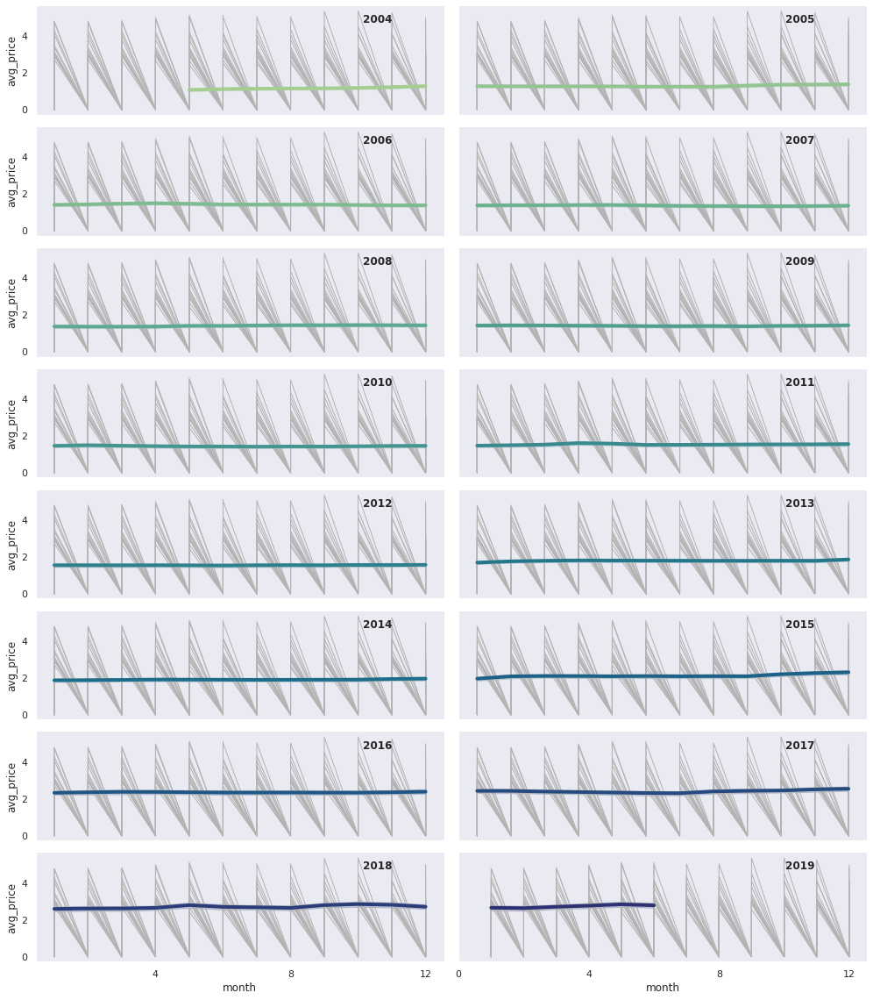

In [ ]:
# Tentativa de fazer gráfico de série histórica de média de preço x meses e ano
# Exemplo retirado da documentação do SEABORN

sns.set_theme(style="dark")

# Plot por ano
g = sns.relplot(
    data=df,
    x="month", y="avg_price", col="year", hue="year",
    kind="line", palette="crest", linewidth=4, zorder=5,
    col_wrap=2, height=2, aspect=3.5, legend=False,
)

# Iterate over each subplot to customize further
for year, ax in g.axes_dict.items():

    # Add the title as an annotation within the plot
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold")

    # Plot every year's time series in the background
    sns.lineplot(
        data=df, x="month", y="avg_price", units="year",
        estimator=None, color=".7", linewidth=1, ax=ax,
    )

# Reduce the frequency of the x axis ticks
ax.set_xticks(ax.get_xticks()[::2])

# Tweak the supporting aspects of the plot
g.set_titles("")
g.set_axis_labels("month", "avg_price")
g.tight_layout()

In [ ]:
# Criando novo dataframe considerando os valores convertidos na mesma unidade de medida, média de preço do ano inteiro/tipo de combustível.
# Nota: Os dados do DIESEL S10 começam a ser coletados a partir de 2012.

df_fuels_avg = df.groupby(['year', 'fuel']).mean()['avg_price'].unstack().round(3)
df_fuels_avg

fuel,DIESEL,DIESEL S10,HYDROUS ETHANOL,LPG,NATURAL GAS,REGULAR GASOLINE
year,,,,,,
2004,1.563,NaN,1.528,0.002,0.001,2.239
2005,1.786,NaN,1.700,0.002,0.001,2.437
2006,1.930,NaN,1.967,0.002,0.001,2.655
2007,1.919,NaN,1.751,0.002,0.001,2.603
2008,2.081,NaN,1.772,0.002,0.002,2.605
2009,2.111,NaN,1.772,0.002,0.002,2.612
2010,2.063,NaN,1.936,0.002,0.002,2.662
2011,2.084,NaN,2.203,0.002,0.002,2.781
2012,2.136,2.242,2.226,0.002,0.002,2.783


In [ ]:
# Cria uma lista com os combustíveis para usar na próxima célula
fuel_list = df_fuels_avg.columns.unique().tolist()

In [ ]:
# Gráfico de evolução dos preços médios de combustíveis ao longo dos anos
fig = go.Figure()

for fuel in fuel_list:
    fig.add_trace(go.Scatter(x = df_fuels_avg.index,y = df_fuels_avg[fuel],mode = 'lines',name = fuel))

fig.update_layout(title=go.layout.Title(text="Price of fuels by years",xref="paper",x=0),
    xaxis=go.layout.XAxis(title=go.layout.xaxis.Title(text="Years")),
    yaxis=go.layout.YAxis(title=go.layout.yaxis.Title( text="Price (R$/l)")))


fig.update_xaxes(showline=True, linewidth=2, linecolor='black', mirror=True)
fig.update_yaxes(showline=True, linewidth=2, linecolor='black', mirror=True)


fig.show()

In [ ]:
# Tentativa de gráfico de Média de preço do combustível por estado
import plotly.express as px
fig = px.bar(df, x="avg_price", y="state", color='fuel', orientation='h',
             hover_data=["state","region", "fuel", "avg_price"],
             height=1000,
             title="Fuel's Avg_price x State")
fig.show()

In [ ]:
## Próximos passos: ##
# 1. Criar dataframes por região;
# 2. Explorar gráficos com outras relações;
# 3. Tentar responder às tasks propostas no kaggle;
# 4. Criar modelo baseado na serie histórica dos preços, aplicar ao valores atualizados do ano de 2020-2021;